In [35]:
from PIL import Image
import random
from matplotlib import pyplot as plt
from IPython.display import display
import numpy as np
import math, os, pdb, cv2, copy, time, dlib
import pandas as pd
import seaborn as sns
import tensorflow as tf
import sys
import h5py
import torch
import torchvision.transforms as transforms
from IDGP.FER_preprocess_funcs import *

In [36]:
root_fer = ".\\AffectNet" #where raw data stored
root_file = ".\\modules"
path_train_img = os.path.join(root_fer, 'train_images')
path_train_anno = os.path.join(root_fer, 'train_annotations')
path_val_img = os.path.join(root_fer, 'val_images')
path_val_anno = os.path.join(root_fer, 'val_annotations')
path_model_file = os.path.join(root_file, 'res10_300x300_ssd_iter_140000.caffemodel')
path_prototxt_file = os.path.join(root_file, 'deploy.prototxt.txt')
path_eye_detector = os.path.join(root_file, 'haarcascade_eye.xml')
network = cv2.dnn.readNetFromCaffe(path_prototxt_file, path_model_file)
eye_cascade = cv2.CascadeClassifier(path_eye_detector)

# Organizing dataset

In [ ]:
train_annotation_path_names = []
train_annotation_filenames = []
train_annotation_image_names = []
train_unique_annotation_image_names, train_annotation_image_names, train_annotation_filenames, train_annotation_path_names = get_annotations(path_train_anno,
                                                                                                                                             train_annotation_path_names,
                                                                                                                                             train_annotation_filenames,
                                                                                                                                             train_annotation_image_names)

In [ ]:
val_annotation_path_names = []
val_annotation_filenames = []
val_annotation_image_names = []
val_unique_annotation_image_names, val_annotation_image_names, val_annotation_filenames, val_annotation_path_names = get_annotations(path_val_anno,
                                                                                                                                      val_annotation_path_names,
                                                                                                                                      val_annotation_filenames,
                                                                                                                                      val_annotation_image_names)

In [ ]:
train_all_image_values = []
train_all_image_values = load_image_labels(path_train_anno, train_unique_annotation_image_names, train_all_image_values)

In [ ]:
val_all_image_values = []
val_all_image_values = load_image_labels(path_val_anno, val_unique_annotation_image_names, val_all_image_values)

In [ ]:
train_image_path = []
train_image_path = show_original_image(train_image_path, train_unique_annotation_image_names, path_train_img)

In [ ]:
val_image_path = []
val_image_path = show_original_image(val_image_path, val_unique_annotation_image_names, path_val_img)

# Image dataframe

In [ ]:
train_aro_label_values = []
train_val_label_values = []
train_exp_label_values = []
train_aro_label_values, train_val_label_values, train_exp_label_values = separate_labels(train_aro_label_values, train_val_label_values, train_exp_label_values, train_all_image_values)

In [ ]:
val_aro_label_values = []
val_val_label_values = []
val_exp_label_values = []
val_aro_label_values, val_val_label_values, val_exp_label_values = separate_labels(val_aro_label_values, val_val_label_values, val_exp_label_values, val_all_image_values)

In [ ]:
train_images_df = create_labels_data_df(train_unique_annotation_image_names, train_aro_label_values,
                                        train_val_label_values, train_exp_label_values, False)
train_images_df.to_csv('generated_data\\train_images_df.csv')
train_images_df

In [ ]:
count_exp_labels(train_images_df, "exp")

In [ ]:
val_images_df = create_labels_data_df(val_unique_annotation_image_names, val_aro_label_values,
                                      val_val_label_values, val_exp_label_values, False)
val_images_df.to_csv('generated_data\\test_images_df.csv')
val_images_df

In [ ]:
count_exp_labels(val_images_df, "exp")

# Sampling images for each emotions

In [52]:
train_images_df = pd.read_csv('generated_data\\train_images_df.csv')
val_images_df = pd.read_csv('generated_data\\test_images_df.csv')
train_images_df = train_images_df.drop(['Unnamed: 0'], axis=1)
val_images_df = val_images_df.drop(['Unnamed: 0'], axis=1)

In [53]:
train_images_df2 = train_images_df.copy()
test_images_df2 = val_images_df.copy()
train_images_df2 = train_images_df2.astype({"imagename": str, "aro": float, "val": float, "exp": int})
test_images_df2 = test_images_df2.astype({"imagename": str, "aro": float, "val": float, "exp": int})

In [54]:
n_train_img = 480
chosen_train_images = sampling_images(train_images_df2, n_train_img)
chosen_test_images = sampling_images(test_images_df2, 100)

3840
800


In [55]:
chosen_train_df = train_images_df2[train_images_df2['imagename'].isin(chosen_train_images)]
chosen_train_df

,imagename,aro,val,exp
325,366028,0.577804,0.338713,3
464,20630,0.806934,-0.483164,6
501,237754,-0.034569,-0.002161,0
624,25957,0.769841,-0.626984,5
641,414507,0.714286,0.238095,3
...,...,...,...,...
287178,216603,0.253968,-0.500000,6
287247,130198,-0.007937,0.007937,0
287271,242913,0.658149,-0.658149,7
287300,161891,0.524749,-0.806704,5


In [56]:
chosen_test_df = test_images_df2[test_images_df2['imagename'].isin(chosen_test_images)]
chosen_test_df.to_csv('generated_data\\chosen_test_df.csv')
chosen_test_df

,imagename,aro,val,exp
0,1929,-0.004313,0.017253,0
1,4807,0.779133,-0.082269,4
2,508,0.460317,-0.666667,5
3,2893,0.811915,-0.488145,6
4,3546,0.131690,0.526759,1
...,...,...,...,...
3978,656,0.849206,0.182540,3
3981,3145,0.179098,-0.453013,0
3982,2906,-0.198413,-0.460317,2
3987,3059,0.527487,-0.716221,6


In [25]:
train_image_names = list(chosen_train_df["imagename"])
train_image_aro = list(chosen_train_df["aro"])
train_image_val = list(chosen_train_df["val"])
train_image_exp = list(chosen_train_df["exp"])

test_image_names = list(chosen_test_df["imagename"])
test_image_aro = list(chosen_test_df["aro"])
test_image_val = list(chosen_test_df["val"])
test_image_exp = list(chosen_test_df["exp"])

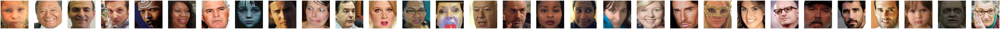

In [26]:
train_chosen_image_path = []
train_chosen_image_path = show_original_image(train_chosen_image_path, train_image_names, path_train_img)

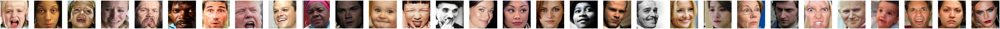

In [27]:
test_chosen_image_path = []
test_chosen_image_path = show_original_image(test_chosen_image_path, test_image_names, path_val_img)

In [28]:
train_red = []
train_green = []
train_blue = []
train_red, train_green, train_blue = get_img_rgb(train_red, train_green, train_blue, train_chosen_image_path)

In [29]:
chosen_train_df_rgb = create_labels_data_df(train_image_names, train_image_aro, train_image_val, train_image_exp,
                          rgb = True, red = train_red, green = train_green, blue = train_blue)
chosen_train_df_rgb.to_csv('generated_data\\chosen_train_df_rgb.csv')
chosen_train_df_rgb

,imagename,red,green,blue,aro,val,exp
0,366028,116,118,104,0.577804,0.338713,3
1,20630,119,106,198,0.806934,-0.483164,6
2,237754,249,248,200,-0.034569,-0.002161,0
3,25957,170,156,147,0.769841,-0.626984,5
4,414507,250,250,250,0.714286,0.238095,3
...,...,...,...,...,...,...,...
3835,216603,181,188,198,0.253968,-0.500000,6
3836,130198,108,75,94,-0.007937,0.007937,0
3837,242913,179,169,159,0.658149,-0.658149,7
3838,161891,230,144,97,0.524749,-0.806704,5


# Pre-processing image: face alignment, histogram equalization, noise reduction

In [30]:
train_complex_images_nohist_nonoise = []
train_images_data_nohist_nonoise = []
image_size_128 = (128,128)
for image in train_chosen_image_path:
    train_images_data_nohist_nonoise.append(img_preprocessing(network, eye_cascade, image, train_complex_images_nohist_nonoise, False, False))
X_train = resize_convert_images(image_size_128, train_images_data_nohist_nonoise)
save_dataset_to_hp5(train_image_aro, train_image_val, train_image_exp, "generated_data\\train_images_data_nn_128px.h5", X_train)

In [30]:
train_complex_images_yeshist_nonoise = []
train_images_data_yeshist_nonoise = []
for image in train_chosen_image_path:
    train_images_data_yeshist_nonoise.append(img_preprocessing(network, eye_cascade, train_complex_images_yeshist_nonoise, True, False))
X_train = resize_convert_images(image_size_128, train_images_data_yeshist_nonoise)
save_dataset_to_hp5(train_image_aro, train_image_val, train_image_exp, "generated_data\\train_images_data_yn_128px.h5", X_train)

In [31]:
train_complex_images_nohist_yesnoise = []
train_images_data_nohist_yesnoise = []
for image in train_chosen_image_path:
    train_images_data_nohist_yesnoise.append(img_preprocessing(network, eye_cascade, image, train_complex_images_nohist_yesnoise, False, True))
X_train = resize_convert_images(image_size_128, train_images_data_nohist_yesnoise)
save_dataset_to_hp5(train_image_aro, train_image_val, train_image_exp, "generated_data\\train_images_data_ny_128px.h5", X_train)

In [33]:
train_complex_images_yeshist_yesnoise = []
train_images_data_yeshist_yesnoise = []
for image in train_chosen_image_path:
    train_images_data_yeshist_yesnoise.append(img_preprocessing(network, eye_cascade, image, train_complex_images_yeshist_yesnoise, True, True))
X_train = resize_convert_images(image_size_128, train_images_data_yeshist_yesnoise)
save_dataset_to_hp5(train_image_aro, train_image_val, train_image_exp, "generated_data\\train_images_data_yy_128px_3kimg.h5", X_train)

In [33]:
test_complex_images_nohist_nonoise = []
test_images_data_nohist_nonoise = []
for image in test_chosen_image_path:
    test_images_data_nohist_nonoise.append(img_preprocessing(network, eye_cascade, image, test_complex_images_nohist_nonoise, False, False))
X_test = resize_convert_images(image_size_128, test_images_data_nohist_nonoise)
save_dataset_to_hp5(test_image_aro, test_image_val, test_image_exp, "generated_data\\test_images_data_nn_128px.h5", X_test)

In [34]:
test_complex_images_yeshist_nonoise = []
test_images_data_yeshist_nonoise = []
for image in test_chosen_image_path:
    test_images_data_yeshist_nonoise.append(img_preprocessing(network, eye_cascade, image, test_complex_images_yeshist_nonoise, True, False))
X_test = resize_convert_images(image_size_128, test_images_data_yeshist_nonoise)
save_dataset_to_hp5(test_image_aro, test_image_val, test_image_exp, "generated_data\\test_images_data_yn_128px.h5", X_test)

In [35]:
test_complex_images_nohist_yesnoise = []
test_images_data_nohist_yesnoise = []
for image in test_chosen_image_path:
    test_images_data_nohist_yesnoise.append(img_preprocessing(network, eye_cascade, image, test_complex_images_nohist_yesnoise, False, True))
X_test = resize_convert_images(image_size_128, test_images_data_nohist_yesnoise)
save_dataset_to_hp5(test_image_aro, test_image_val, test_image_exp, "generated_data\\test_images_data_ny_128px.h5", X_test)

In [34]:
test_complex_images_yeshist_yesnoise = []
test_images_data_yeshist_yesnoise = []
for image in test_chosen_image_path:
    test_images_data_yeshist_yesnoise.append(img_preprocessing(network, eye_cascade, image, test_complex_images_yeshist_yesnoise, True, True))
X_test = resize_convert_images(image_size_128, test_images_data_yeshist_yesnoise)
save_dataset_to_hp5(test_image_aro, test_image_val, test_image_exp, "generated_data\\test_images_data_yy_128px_3kimg.h5", X_test)

# Quick look at the data

In [24]:
X_nn, y_nn = load_dataset_from_disk('generated_data\\test_images_data_nn_128px.h5')
# X_ny, y_ny = load_dataset_from_disk('generated_data\\test_images_data_ny_128px.h5')
# X_yn, y_yn = load_dataset_from_disk('generated_data\\test_images_data_yn_128px.h5')
# X_yy, y_yy = load_dataset_from_disk('generated_data\\test_images_data_yy_128px.h5')

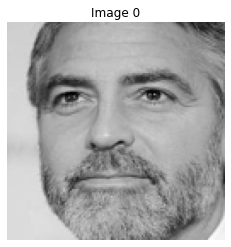

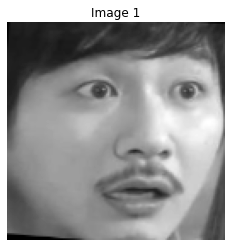

In [27]:
show_preprocessed_images(X_nn, 2)

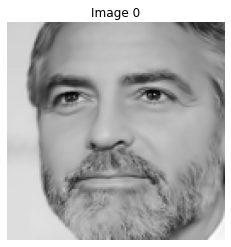

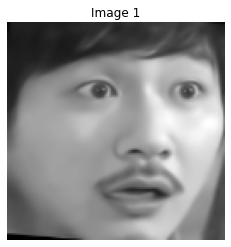

In [39]:
show_preprocessed_images(X_ny, 2)

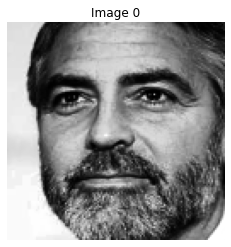

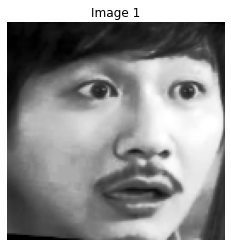

In [40]:
show_preprocessed_images(X_yn, 2)

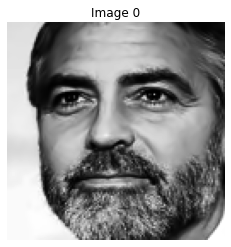

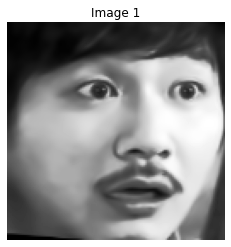

In [41]:
show_preprocessed_images(X_yy, 2)